# Plots MCS precipitation climatology maps by season, month and year

## Monthly mean data is produced by:
- calc_tbpf_mcs_monthly_rainmap_gridrad.py

In [1]:
import numpy as np
import glob, os
import xarray as xr
import pandas as pd
from scipy.ndimage import gaussian_filter
import time, datetime, calendar, pytz
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.gridspec as gridspec
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from copy import copy
%matplotlib inline

## MCS Dataset V3

In [2]:
grddir = '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/'
years = np.arange(2004,2018,1)
grdfiles = []
for iy in range(0, len(years)):
    grdfiles.extend(sorted(glob.glob(f'{grddir}mcs_rainmap_{years[iy]}*.nc')))
print(f'Number of files: {len(grdfiles)}')

narrfile = '/global/cfs/cdirs/m2689/zhefeng/narr/map_data/hgt.sfc.nc'

figdir = '/global/cfs/cdirs/m2637/zfeng/gridrad_v3/figures/'
os.makedirs(figdir, exist_ok=True)

Number of files: 168


## MCS Dataset V2

In [3]:
# grddir = '/global/cfs/cdirs/m2637/zfeng/gridrad_v2/stats_linkpf/monthly/'
# years = np.arange(2004,2018,1)
# grdfiles = []
# for iy in range(0, len(years)):
#     grdfiles.extend(sorted(glob.glob(f'{grddir}mcs_rainmap_{years[iy]}*.nc')))
# print(f'Number of files: {len(grdfiles)}')

# narrfile = '/global/cfs/cdirs/m2689/zhefeng/narr/map_data/hgt.sfc.nc'

# figdir = '/global/cfs/cdirs/m2637/zfeng/gridrad_v2/figures/'
# os.makedirs(figdir, exist_ok=True)

In [4]:
# Read NARR file for terrain height
dsnarr = xr.open_dataset(narrfile)
dsnarr

<xarray.Dataset>
Dimensions:            (y: 277, x: 349, time: 1)
Coordinates:
    lat                (y, x) float32 ...
    lon                (y, x) float32 ...
  * time               (time) datetime64[ns] 1800-01-01T11:30:12.606811523
  * x                  (x) float32 0.0 3.246e+04 ... 1.126e+07 1.13e+07
  * y                  (y) float32 0.0 3.246e+04 ... 8.927e+06 8.96e+06
Data variables:
    hgt                (time, y, x) float32 ...
    Lambert_Conformal  int32 ...
Attributes: (12/14)
    standardpar1:  50.0
    standardpar2:  50.000001
    centerlon:     -107.0
    centerlat:     50.0
    latcorners:    [ 1.000001  0.897945 46.3544   46.63433 ]
    loncorners:    [-145.5       -68.32005    -2.569891  148.6418  ]
    ...            ...
    Conventions:   CF-1.0
    history:       created 2005 by Hoop in NetCDF
    comments:      data is from NCEP NARR  (8x/day)
    platform:      Model
    institution:   National Centers for Environmental Prediction
    references:    http://wwwt.emc.ncep.noaa.gov/mmb/rreanl/index.html\nhttp:...

In [5]:
# Read all monthly files
ds = xr.open_mfdataset(grdfiles, concat_dim='time', combine='nested')
ds

<xarray.Dataset>
Dimensions:                  (time: 168, lat: 715, lon: 1100)
Coordinates:
  * time                     (time) datetime64[ns] 2004-01-01 ... 2017-12-01
  * lat                      (lat) float32 25.02 25.05 25.09 ... 50.96 50.99
  * lon                      (lon) float32 -110.0 -110.0 ... -70.05 -70.01
Data variables:
    longitude                (time, lat, lon) float32 dask.array<chunksize=(1, 715, 1100), meta=np.ndarray>
    latitude                 (time, lat, lon) float32 dask.array<chunksize=(1, 715, 1100), meta=np.ndarray>
    precipitation            (time, lat, lon) float32 dask.array<chunksize=(1, 715, 1100), meta=np.ndarray>
    mcs_precipitation        (time, lat, lon) float32 dask.array<chunksize=(1, 715, 1100), meta=np.ndarray>
    mcs_precipitation_count  (time, lat, lon) float32 dask.array<chunksize=(1, 715, 1100), meta=np.ndarray>
    ntimes                   (time) float32 dask.array<chunksize=(1,), meta=np.ndarray>
Attributes:
    title:       MCS precipitation accumulation
    contact:     Zhe Feng, zhe.feng@pnnl.gov
    created_on:  Wed Jul 17 19:15:31 2024

In [6]:
nx = ds.dims['lon']
ny = ds.dims['lat']
lon = ds.lon
lat = ds.lat

In [7]:
years = pd.date_range(start=ds.time.min().values, end=ds.time.max().values, freq='AS')
nyears = len(years)
years

DatetimeIndex(['2004-01-01', '2005-01-01', '2006-01-01', '2007-01-01',
               '2008-01-01', '2009-01-01', '2010-01-01', '2011-01-01',
               '2012-01-01', '2013-01-01', '2014-01-01', '2015-01-01',
               '2016-01-01', '2017-01-01'],
              dtype='datetime64[ns]', freq='AS-JAN')

In [8]:
uniq_years = np.unique(ds.time.dt.year)
print(uniq_years)
year_min = np.min(uniq_years)
year_max = np.max(uniq_years)
print(year_min, year_max)

[2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017]
2004 2017


/global/common/software/m1867/python/py310/lib/python3.10/site-packages/xarray/core/accessor_dt.py:72: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  values_as_series = pd.Series(values.ravel(), copy=False)


### Calculate annual mean

In [9]:
nhours = ds.ntimes.groupby('time.year').sum()

totpcp_year = 24 * (ds.precipitation.groupby('time.year').sum(dim='time') / nhours).load()
mcspcp_year = 24 * (ds.mcs_precipitation.groupby('time.year').sum(dim='time') / nhours).load()
mcsfrac_year = 100 * (mcspcp_year / totpcp_year).load()
mcsfreq_year = 100 * (ds.mcs_precipitation_count.groupby('time.year').sum(dim='time') / nhours).load()

### Calculate warm/cold season mean

In [10]:
# Find index for all warm/cold season months
months_warm = ds.time[np.where((ds.time.dt.month >= 3) & (ds.time.dt.month <= 8))]
months_cold = ds.time[np.where((ds.time.dt.month < 3) | (ds.time.dt.month > 8))]

# Compute total number of hours in warm/cold season for each year
nhours_warm = np.ndarray(nyears, dtype=float)
nhours_cold = np.ndarray(nyears, dtype=float)
for iy in range(nyears):
#     print(years.year[iy]-1, years.year[iy])
    nhours_warm[iy] = ds.ntimes.sel(time=months_warm).sel(time=slice(f'{years.year[iy]-1}-12-1',f'{years.year[iy]}-11-30')).sum().values
    nhours_cold[iy] = ds.ntimes.sel(time=months_cold).sel(time=slice(f'{years.year[iy]-1}-12-1',f'{years.year[iy]}-11-30')).sum().values
# Convert numpy array to Xarray
nhours_warm = xr.DataArray(nhours_warm, coords={'year':years.year}, dims=('year'))
nhours_cold = xr.DataArray(nhours_cold, coords={'year':years.year}, dims=('year'))

# Compute mean precipitation in warm/cold season for each year [mm/day]
totpcp_warm = 24 * (ds.precipitation.sel(time=months_warm).groupby('time.year').sum(dim='time') / nhours_warm).load()
totpcp_cold = 24 * (ds.precipitation.sel(time=months_cold).groupby('time.year').sum(dim='time') / nhours_cold).load()
mcspcp_warm = 24 * (ds.mcs_precipitation.sel(time=months_warm).groupby('time.year').sum(dim='time') / nhours_warm).load()
mcspcp_cold = 24 * (ds.mcs_precipitation.sel(time=months_cold).groupby('time.year').sum(dim='time') / nhours_cold).load()
mcsfrac_warm = 100 * (mcspcp_warm / totpcp_warm).load()
mcsfrac_cold = 100 * (mcspcp_cold / totpcp_cold).load()
# MCS precipitation frequency/hour
mcsfreq_warm = 100 * (ds.mcs_precipitation_count.groupby('time.year').sum(dim='time') / nhours_warm).load()
mcsfreq_cold = 100 * (ds.mcs_precipitation_count.groupby('time.year').sum(dim='time') / nhours_cold).load()
mcspcpcount_warm = (ds.mcs_precipitation_count.groupby('time.year').sum(dim='time')).load()
mcspcpcount_cold = (ds.mcs_precipitation_count.groupby('time.year').sum(dim='time')).load()

/global/common/software/m1867/python/py310/lib/python3.10/site-packages/xarray/core/accessor_dt.py:72: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  values_as_series = pd.Series(values.ravel(), copy=False)


In [11]:
mcspcpcount_warm = (ds.mcs_precipitation_count.groupby('time.year').sum(dim='time')).load()
mcspcpcount_cold = (ds.mcs_precipitation_count.groupby('time.year').sum(dim='time')).load()

### Calculate 4 season mean

In [12]:
nhours_season = ds.ntimes.groupby('time.season').sum()

totpcp_season = 24 * (ds.precipitation.groupby('time.season').sum(dim='time') / nhours_season).load()
mcspcp_season = 24 * (ds.mcs_precipitation.groupby('time.season').sum(dim='time') / nhours_season).load()
mcsfreq_season = 100 * (ds.mcs_precipitation_count.groupby('time.season').sum(dim='time') / nhours_season).load()
mcspcpcount_season = (ds.mcs_precipitation_count.groupby('time.season').sum(dim='time') / nyears).load()
mcsfrac_season = 100 * (mcspcp_season / totpcp_season).load()

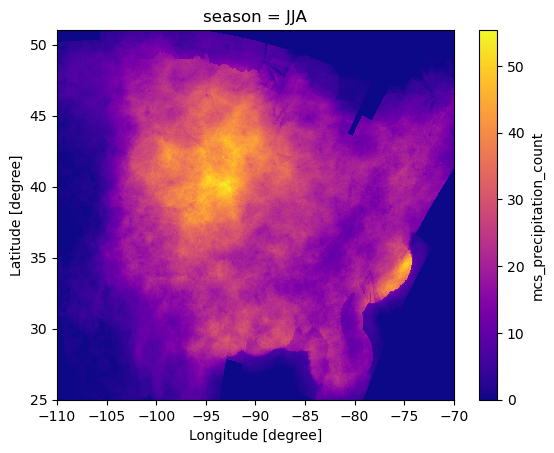

In [13]:
mcspcpcount_season.sel(season='JJA').plot(cmap='plasma')

### Calculate monthly mean

In [14]:
nhours_month = ds.ntimes.groupby('time.month').sum()

totpcp_month = 24 * (ds.precipitation.groupby('time.month').sum(dim='time') / nhours_month).load()
mcspcp_month = 24 * (ds.mcs_precipitation.groupby('time.month').sum(dim='time') / nhours_month).load()
mcsfrac_month = 100 * (mcspcp_month / totpcp_month).load()
mcsfreq_month = 100 * (ds.mcs_precipitation_count.groupby('time.month').sum(dim='time') / nhours_month).load()
mcspcpcount_month = (ds.mcs_precipitation_count.groupby('time.month').sum(dim='time') / nyears).load()

### Calculate warm/cold season anomaly

In [15]:
mcspcp_warm_avg = mcspcp_warm.mean(dim='year')
mcspcp_cold_avg = mcspcp_cold.mean(dim='year')
mcspcp_warm_anom = mcspcp_warm - mcspcp_warm_avg
mcspcp_cold_anom = mcspcp_cold - mcspcp_cold_avg

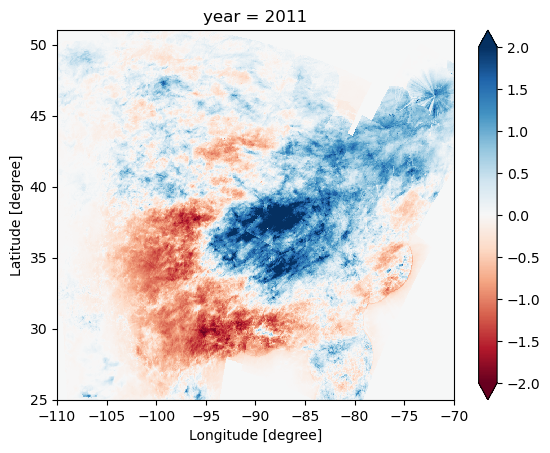

In [16]:
mcspcp_warm_anom.sel(year=2011).plot(vmin=-2, vmax=2, cmap='RdBu')

In [17]:
# lonbox = [-104, -82]
lonbox = [-102, -85]
latbox = [31, 48]
# Calculate average value within central U.S. defined by the box
totpcp_avg = totpcp_year.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcspcp_avg = mcspcp_year.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcsfrac_avg = 100 * (mcspcp_year.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat')) / \
                totpcp_year.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat'))).load()
mcsfreq_avg = mcsfreq_year.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()

In [18]:
totpcp_warm_avg = totpcp_warm.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcspcp_warm_avg = mcspcp_warm.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcsfrac_warm_avg = 100 * (mcspcp_warm.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat')) / \
                          totpcp_warm.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat'))).load()
mcsfreq_warm_avg = mcsfreq_warm.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcspcpcount_warm_avg = mcspcpcount_warm.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()

totpcp_cold_avg = totpcp_cold.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcspcp_cold_avg = mcspcp_cold.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcsfrac_cold_avg = 100 * (mcspcp_cold.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat')) / \
                          totpcp_cold.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat'))).load()
mcsfreq_cold_avg = mcsfreq_cold.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcspcpcount_cold_avg = mcspcpcount_cold.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()

In [19]:
totpcp_season_avg = totpcp_season.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcspcp_season_avg = mcspcp_season.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcsfrac_season_avg = 100 * (mcspcp_season.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat')) / \
                            totpcp_season.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat'))).load()
mcsfreq_season_avg = mcsfreq_season.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcspcpcount_season_avg = mcspcpcount_season.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()

In [20]:
months = ds.time.dt.month
months

/global/common/software/m1867/python/py310/lib/python3.10/site-packages/xarray/core/accessor_dt.py:72: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  values_as_series = pd.Series(values.ravel(), copy=False)


<xarray.DataArray 'month' (time: 168)>
array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,
        7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,
        1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,
        7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,
        1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,
        7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,
        1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,
        7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,
        1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,
        7,  8,  9, 10, 11, 12])
Coordinates:
  * time     (time) datetime64[ns] 2004-01-01 2004-02-01 ... 2017-12-01
Attributes:
    long_name:  Epoch Time (since 1970-01-01T00:00:00)

In [21]:
# # Total number of hours
# nhours_mam = ds.ntimes.where((months >= 3) & (months <= 5)).sum(dim='time')
# nhours_jja = ds.ntimes.where((months >= 6) & (months <= 8)).sum(dim='time')

# # Total number of hours for each season
# nhours_mam_year = ds.ntimes.where((months >= 3) & (months <= 5)).groupby('time.year').sum()
# nhours_jja_year = ds.ntimes.where((months >= 6) & (months <= 8)).groupby('time.year').sum()
# # Spring vs. Summer mean precipitation
# totpcp_mam_year = 24 * ds.precipitation.where((months >= 3) & (months <= 5)).groupby('time.year').sum(dim='time') / nhours_mam_year
# mcspcp_mam_year = 24 * ds.mcs_precipitation.where((months >= 3) & (months <= 5)).groupby('time.year').sum(dim='time') / nhours_mam_year
# totpcp_jja_year = 24 * ds.precipitation.where((months >= 6) & (months <= 8)).groupby('time.year').sum(dim='time') / nhours_jja_year
# mcspcp_jja_year = 24 * ds.mcs_precipitation.where((months >= 6) & (months <= 8)).groupby('time.year').sum(dim='time') / nhours_jja_year
# # MCS frequency
# mcsfreq_mam_year = ds.mcs_precipitation_count.where((months >= 3) & (months <= 5)).groupby('time.year').sum(dim='time') / nhours_mam_year
# mcsfreq_jja_year = ds.mcs_precipitation_count.where((months >= 6) & (months <= 8)).groupby('time.year').sum(dim='time') / nhours_jja_year

In [22]:
totpcp_month_avg = totpcp_month.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcspcp_month_avg = mcspcp_month.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcsfrac_month_avg = 100 * (mcspcp_month.sel(lon=slice(lonbox[0], lonbox[1]), \
                                           lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat')) / \
                            totpcp_month.sel(lon=slice(lonbox[0], lonbox[1]), \
                                           lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat'))).load()
mcsfreq_month_avg = mcsfreq_month.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()
mcspcpcount_month_avg = mcspcpcount_month.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat')).load()

In [23]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=256):
    """ Truncate colormap.
    """
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

# Plot map by season for paper (1 color bar)

In [24]:
def plot_map_4seasons(dataarray, levels, cmap, cblabel, cbticks, figname, avg_arr=None):
    
    mpl.rcParams['font.size'] = 13
    mpl.rcParams['font.family'] = 'Helvetica'

    map_extent = [-107, -76.1, 25, 50.1]
    lonv = np.arange(-105,-75.1,10)
    latv = np.arange(25,50.1,5)

    proj = ccrs.LambertConformal()
    data_proj = ccrs.PlateCarree()
    levelshgt = [500,1000,2000]
    hgt = gaussian_filter(dsnarr.hgt.squeeze(), 0.6)
    season = ['MAM','JJA','SON','DJF']
    titles = ['(a) MAM', '(b) JJA', '(c) SON', '(d) DJF']

    fig = plt.figure(figsize=[10,8], dpi=100)
    gs = gridspec.GridSpec(2,2, height_ratios=[1,1], width_ratios=[0.8,0.8])
    gs.update(left=0.05, right=0.90, bottom=0.1, top=0.9, wspace=0.05, hspace=0.12)

    land_50m = cfeature.NaturalEarthFeature('physical', 'land', '50m')
    ocean_50m = cfeature.NaturalEarthFeature('physical', 'ocean', '50m')
    lakes_50m = cfeature.NaturalEarthFeature('physical', 'lakes', '50m')
    borders_50m = cfeature.NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', '50m')
    states = cfeature.NaturalEarthFeature('cultural', 'admin_1_states_provinces_lakes', '50m')

    # Loop over each panel
    for pp in range(0,4):
        ax = plt.subplot(gs[pp], projection=proj)
        ax.set_extent(map_extent, ccrs.Geodetic())
        ax.add_feature(land_50m, facecolor='lightgray')
        ax.add_feature(ocean_50m, edgecolor='k', facecolor=cfeature.COLORS['water'])
        ax.add_feature(states, linewidth=1, edgecolor='k', facecolor='none', zorder=3)
        ax.add_feature(borders_50m, edgecolor='k', facecolor='none', linewidth=1, zorder=3)
        ax.add_feature(land_50m, facecolor='none', edgecolor='k', zorder=3)
        ax.set_title(titles[pp], loc='left')
        ax.set_aspect('auto', adjustable=None)
        # Grid lines
        gl = ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5, dms=True, x_inline=False, y_inline=False)        
        gl.xlocator = mpl.ticker.FixedLocator(lonv)
        gl.ylocator = mpl.ticker.FixedLocator(latv)
        # Set the formatters for the gridlines
        gl.xformatter = LongitudeFormatter()
        gl.yformatter = LatitudeFormatter()
        gl.xlabel_style = {'rotation': 0, 'ha': 'center'}
        gl.ylabel_style = {'rotation': 0}
        # Remove all labels by default
        gl.top_labels = False
        gl.bottom_labels = False
        gl.left_labels = False
        gl.right_labels = False
        if (pp >= 2):
            gl.bottom_labels = True
        if (pp % 2) == 0:
            gl.left_labels = True

        data = dataarray.sel(season=season[pp])
        Zm = np.ma.masked_where(((data == 0) | (np.isnan(data))), data)
#         cf1 = plt.contourf(lon, lat, Zm, levels=levels, cmap=cmap, transform=ccrs.PlateCarree(), zorder=2, extend='both')
        norm = colors.BoundaryNorm(boundaries=levels, ncolors=256)
        cf1 = ax.pcolormesh(lon, lat, Zm, norm=norm, cmap=cmap, transform=ccrs.PlateCarree(), zorder=2)

        # Terrain height
        ct = ax.contour(dsnarr.lon, dsnarr.lat, hgt, levels=levelshgt, \
                        colors='peru', linewidths=1, transform=ccrs.PlateCarree(), zorder=4)
        ctlb = ax.clabel(ct, inline=True, fmt='%.0f', fontsize=12)
        
        # Plot mean values
        if avg_arr is not None:
            # Mean value
            ax.set_title(avg_arr[pp], loc='right', color='magenta')
            # Central US Box
            x1 = np.arange(lonbox[0],lonbox[1]+0.01,0.1)
            y1 = np.repeat(latbox[0],len(x1))
            y2 = np.arange(latbox[0],latbox[1]+0.01,0.1)
            x2 = np.repeat(lonbox[1],len(y2))
            y3 = np.repeat(latbox[1],len(x1))
            x4 = np.repeat(lonbox[0],len(y2))
            ax.plot(x1, y1, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(x2, y2, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(x1, y3, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(x4, y2, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
    
    # Plot 1 colorbar by manually adding a new axes
    cax1 = fig.add_axes([0.93, 0.25, 0.02, 0.5])
    cb1 = plt.colorbar(cf1, cax=cax1, label=cblabel, ticks=cbticks, orientation='vertical', extend='both')
    cb1.set_label(cblabel, fontsize=15)
    cb1.ax.tick_params(labelsize=15)

    fig.savefig(figname, dpi=300, bbox_inches='tight', facecolor='w')
    return fig

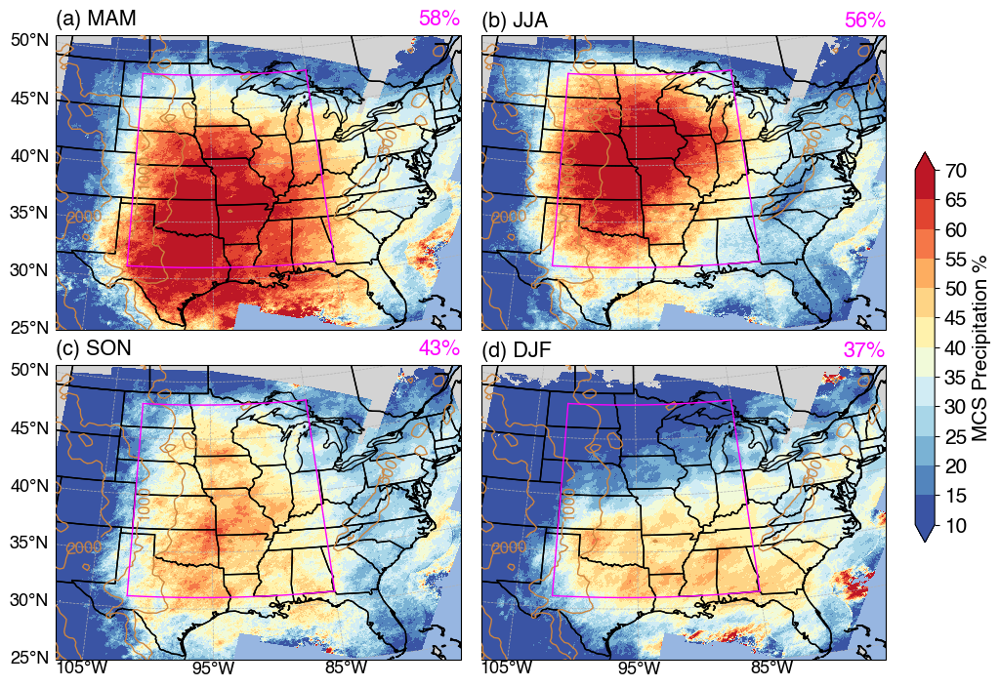

In [25]:
avg_arr = []
unit = '%'
season = ['MAM','JJA','SON','DJF']
for ss in season:
    avg_arr.append(f'{mcsfrac_season_avg.sel(season=ss).values.item():.0f}{unit}')
    
levels = np.arange(10, 70.1, 5)
cbticks = np.arange(10, 70.1, 5)
cblabel = 'MCS Precipitation %'
cmap = plt.get_cmap('RdYlBu_r')
cmap = truncate_colormap(cmap, 0.05, 0.95)
figname = f'{figdir}rainfrac_mcs_map_{year_min}_{year_max}_4seasons.png'
fig = plot_map_4seasons(mcsfrac_season, levels, cmap, cblabel, cbticks, figname, avg_arr=avg_arr)

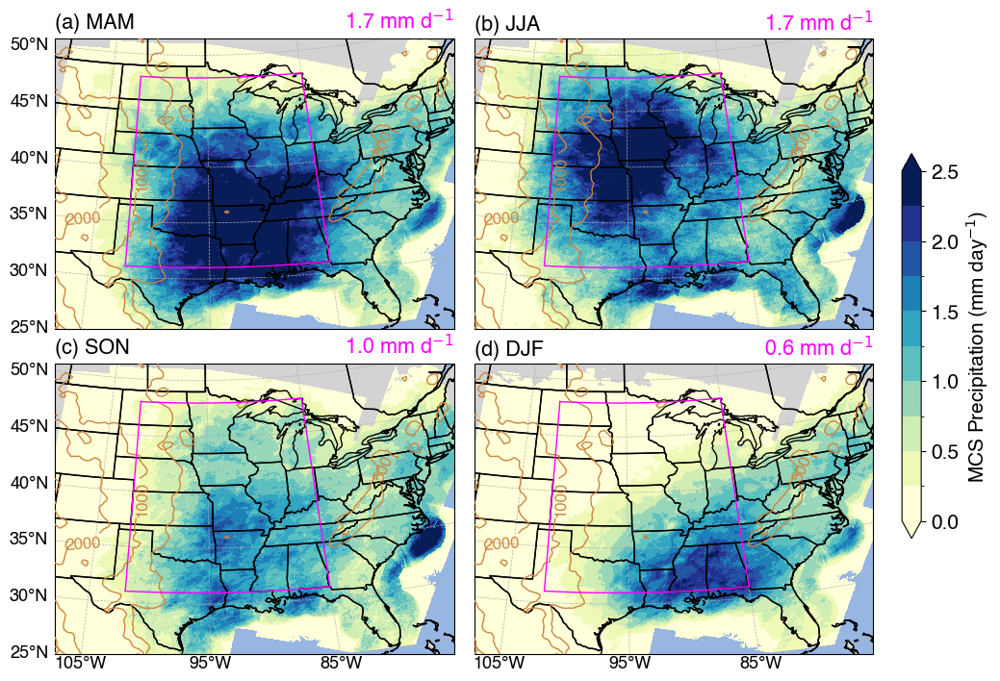

In [26]:
avg_arr = []
unit = 'mm d$^{-1}$'
season = ['MAM','JJA','SON','DJF']
for ss in season:
    avg_arr.append(f'{mcspcp_season_avg.sel(season=ss).values.item():.1f} {unit}')

levels = np.arange(0, 2.51, 0.25)
cbticks = np.arange(0, 2.51, 0.5)
cblabel = 'MCS Precipitation (mm day$^{-1}$)'
cmap = 'YlGnBu'
# cmap = 'viridis'
# cmap = 'Spectral_r'
figname = f'{figdir}rain_mcs_map_{year_min}_{year_max}_4seasons.png'
fig = plot_map_4seasons(mcspcp_season, levels, cmap, cblabel, cbticks, figname, avg_arr=avg_arr)

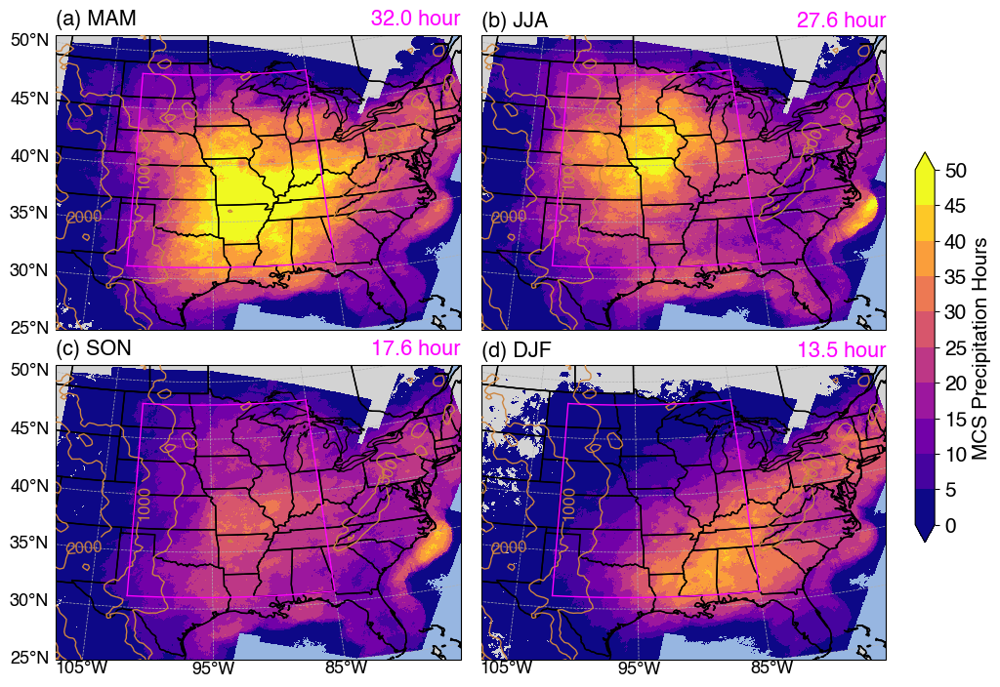

In [27]:
avg_arr = []
unit = 'hour'
season = ['MAM','JJA','SON','DJF']
for ss in season:
    avg_arr.append(f'{mcspcpcount_season_avg.sel(season=ss).values.item():.1f} {unit}')

levels = np.arange(0, 50.1, 5)
cbticks = np.arange(0, 50.1, 5)
cblabel = 'MCS Precipitation Hours'
# cmap = 'YlGnBu'
cmap = 'plasma'
# cmap = 'Spectral_r'
figname = f'{figdir}rainhour_mcs_map_{year_min}_{year_max}_4seasons.png'
fig = plot_map_4seasons(mcspcpcount_season, levels, cmap, cblabel, cbticks, figname, avg_arr=avg_arr)

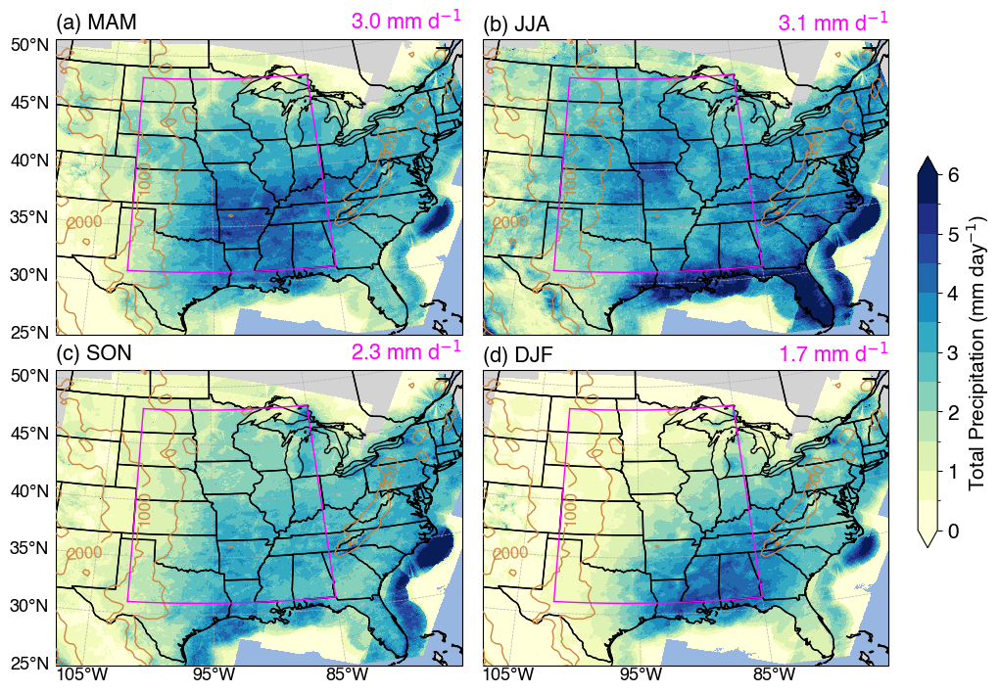

In [28]:
avg_arr = []
unit = 'mm d$^{-1}$'
season = ['MAM','JJA','SON','DJF']
for ss in season:
    avg_arr.append(f'{totpcp_season_avg.sel(season=ss).values.item():.1f} {unit}')
    
levels = np.arange(0, 6.01, 0.5)
cbticks = np.arange(0, 6.01, 1)
cblabel = 'Total Precipitation (mm day$^{-1}$)'
cmap = 'YlGnBu'
# cmap = 'viridis'
figname = f'{figdir}rain_total_map_{year_min}_{year_max}_4seasons.png'
fig = plot_map_4seasons(totpcp_season, levels, cmap, cblabel, cbticks, figname, avg_arr=avg_arr)

## MCS multi-year mean monthly rainmap

In [29]:
def plot_map_bymonth(dataarray, levels, cmap, cblabel, cbticks, years, figname, avg_arr=None):

    mpl.rcParams['font.size'] = 12
    mpl.rcParams['font.family'] = 'Helvetica'
    fig = plt.figure(figsize=[16,5], dpi=100)

    map_extent = [-107, -76.1, 24.9, 50.1]
    lonv = np.arange(-105,-75.1,10)
    latv = np.arange(25,50.1,5)
    proj = ccrs.LambertConformal()
    data_proj = ccrs.PlateCarree()
    land_50m = cfeature.NaturalEarthFeature('physical', 'land', '50m')
    ocean_50m = cfeature.NaturalEarthFeature('physical', 'ocean', '50m')
    lakes_50m = cfeature.NaturalEarthFeature('physical', 'lakes', '50m')
    borders_50m = cfeature.NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', '50m')
    states = cfeature.NaturalEarthFeature('cultural', 'admin_1_states_provinces_lakes', '50m')

    titles = ['Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', \
              'Sep', 'Oct', 'Nov', 'Dec', 'Jan', 'Feb']
    plot_month = [3,4,5,6,7,8,9,10,11,12,1,2]

    ax_save = []
    for pp in range(0,12):

        data = dataarray.sel(month=plot_month[pp])

        ax = plt.subplot(2, 6, pp+1, projection=proj)
        ax.set_extent(map_extent, crs=ccrs.Geodetic())
        ax.add_feature(land_50m, facecolor='lightgray')
        ax.add_feature(ocean_50m, edgecolor='k', facecolor=cfeature.COLORS['water'])
        ax.add_feature(states, linewidth=1, edgecolor='k', facecolor='none', zorder=5)
        ax.add_feature(borders_50m, edgecolor='k', facecolor='none', linewidth=1, zorder=5)
        ax.add_feature(land_50m, facecolor='none', edgecolor='k', zorder=5)
        ax.set_aspect('auto', adjustable=None)
        ax_save.append(ax)
        # Grid lines
        gl = ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5, dms=True, x_inline=False, y_inline=False)        
        gl.xlocator = mpl.ticker.FixedLocator(lonv)
        gl.ylocator = mpl.ticker.FixedLocator(latv)
        # Set the formatters for the gridlines
        gl.xformatter = LongitudeFormatter()
        gl.yformatter = LatitudeFormatter()
        gl.xlabel_style = {'rotation': 0, 'ha': 'center'}
        gl.ylabel_style = {'rotation': 0}
        # Remove all labels by default
        gl.top_labels = False
        gl.bottom_labels = False
        gl.left_labels = False
        gl.right_labels = False
        if (pp >= 6):
            gl.bottom_labels = True
        if ((pp == 0) | (pp == 6)):
            gl.left_labels = True

        cmap = plt.get_cmap(cmap)
        norm = mpl.colors.BoundaryNorm(levels, ncolors=cmap.N, clip=True)
        Zm = np.ma.masked_where(((data == 0) | (np.isnan(data))), data)
        cf1 = ax.pcolormesh(lon, lat, Zm, norm=norm, cmap=cmap, transform=ccrs.PlateCarree(), zorder=2)
        ax.set_title(titles[pp], loc='left')
        
        # Plot mean values
        if avg_arr is not None:
            # Mean value
            ax.set_title(avg_arr[pp], loc='right', color='magenta')
            # Central US Box
            x1 = np.arange(lonbox[0],lonbox[1]+0.01,0.1)
            y1 = np.repeat(latbox[0],len(x1))
            y2 = np.arange(latbox[0],latbox[1]+0.01,0.1)
            x2 = np.repeat(lonbox[1],len(y2))
            y3 = np.repeat(latbox[1],len(x1))
            x4 = np.repeat(lonbox[0],len(y2))
            ax.plot(x1, y1, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(x2, y2, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(x1, y3, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(x4, y2, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)

    fig.tight_layout(w_pad=0.1, h_pad=0.2)
    
    # Plot 1 colorbar by manually adding a new axes
    axpos1 = ax_save[5].get_position()
    axpos2 = ax_save[11].get_position()
    cax = plt.axes([axpos1.x1*1.01, axpos2.y0, 0.01, (axpos1.y1-axpos2.y0)])
    cbar = plt.colorbar(cf1, cax=cax, label=cblabel, ticks=cbticks, orientation='vertical', extend='both')
    cbar.set_label(cblabel, fontsize=15)
    cbar.ax.tick_params(labelsize=15)

    fig.savefig(figname, dpi=300, bbox_inches='tight', facecolor='w')
    return fig

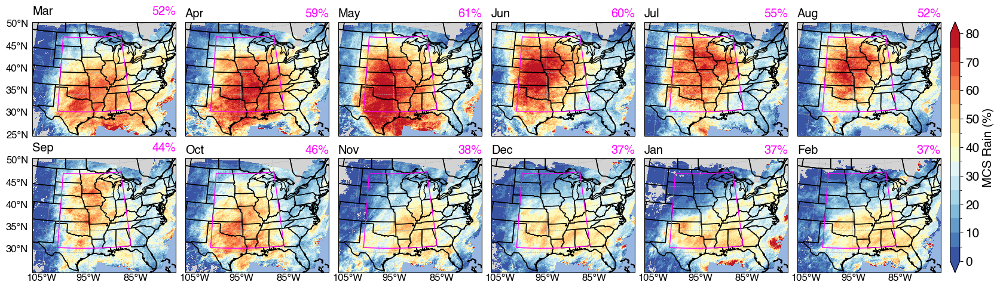

In [30]:
avg_arr = []
unit = '%'
plot_month = [3,4,5,6,7,8,9,10,11,12,1,2]
for mon in range(len(plot_month)):
    avg_arr.append(f'{mcsfrac_month_avg.sel(month=plot_month[mon]).values.item():.0f}{unit}')
levels = np.arange(0, 80.01, 5)
cbticks = np.arange(0, 80.01, 10)
cblabel = 'MCS Rain (%)'
cmap = plt.get_cmap('RdYlBu_r')
cmap = truncate_colormap(cmap, 0.05, 0.95)
figname = f'{figdir}rainfrac_mcs_map_{year_min}_{year_max}_bymonth.png'
fig = plot_map_bymonth(mcsfrac_month, levels, cmap, cblabel, cbticks, years, figname, avg_arr=avg_arr)

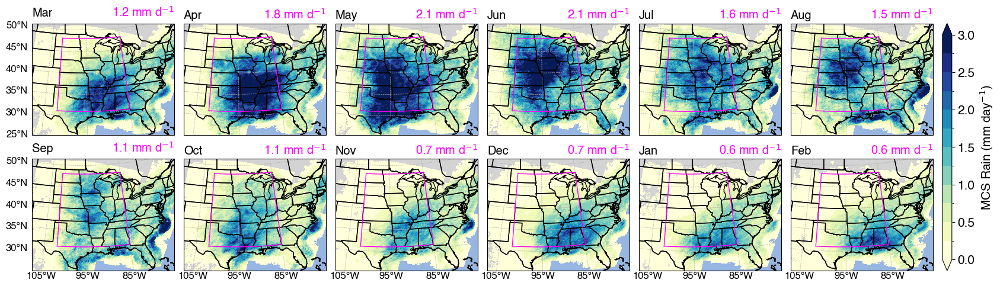

In [31]:
avg_arr = []
unit = 'mm d$^{-1}$'
plot_month = [3,4,5,6,7,8,9,10,11,12,1,2]
for mon in range(len(plot_month)):
    avg_arr.append(f'{mcspcp_month_avg.sel(month=plot_month[mon]).values.item():.1f} {unit}')

levels = np.arange(0, 3.01, 0.25)
cbticks = np.arange(0, 3.01, 0.5)
cblabel = 'MCS Rain (mm day$^{-1}$)'
cmap = 'YlGnBu'
# cmap = 'viridis'
figname = f'{figdir}rain_mcs_map_{year_min}_{year_max}_bymonth.png'
fig = plot_map_bymonth(mcspcp_month, levels, cmap, cblabel, cbticks, years, figname, avg_arr=avg_arr)

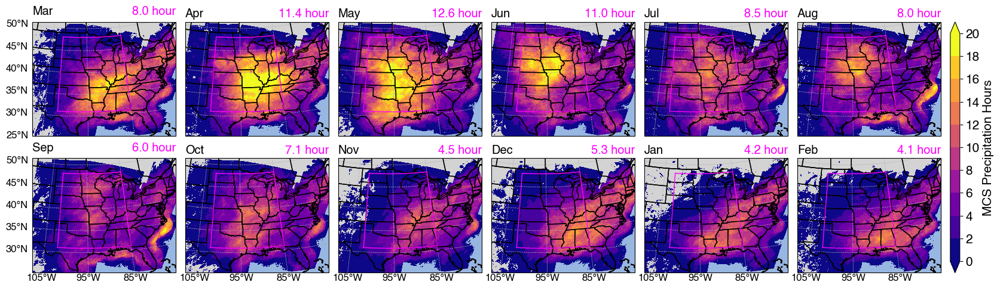

In [32]:
avg_arr = []
unit = 'hour'
plot_month = [3,4,5,6,7,8,9,10,11,12,1,2]
for mon in range(len(plot_month)):
    avg_arr.append(f'{mcspcpcount_month_avg.sel(month=plot_month[mon]).values.item():.1f} {unit}')

levels = np.arange(0, 20.01, 2)
cbticks = np.arange(0, 20.01, 2)
cblabel = 'MCS Precipitation Hours'
cmap = 'plasma'
figname = f'{figdir}rainhour_mcs_map_{year_min}_{year_max}_bymonth.png'
fig = plot_map_bymonth(mcspcpcount_month, levels, cmap, cblabel, cbticks, years, figname, avg_arr=avg_arr)

## Plot mean map by year

In [33]:
def plot_map_byyear(dataarray, levels, cmap, cblabel, cbticks, years, figname, avg_arr=None):

    mpl.rcParams['font.size'] = 12
    mpl.rcParams['font.family'] = 'Helvetica'
    fig = plt.figure(figsize=[16,8], dpi=100)
    gs = gridspec.GridSpec(3,5, height_ratios=[1,1,1], width_ratios=[1,1,1,1,1])
    gs.update(left=0.05, right=0.92, bottom=0.05, top=0.95, wspace=0.05, hspace=0.15)
   
    map_extent = [-107, -76.1, 24.9, 50.1]
    lonv = np.arange(-105,-75.1,10)
    latv = np.arange(25,50.1,5)
    proj = ccrs.LambertConformal()
    data_proj = ccrs.PlateCarree()
    land_50m = cfeature.NaturalEarthFeature('physical', 'land', '50m')
    ocean_50m = cfeature.NaturalEarthFeature('physical', 'ocean', '50m')
    lakes_50m = cfeature.NaturalEarthFeature('physical', 'lakes', '50m')
    borders_50m = cfeature.NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', '50m')
    states = cfeature.NaturalEarthFeature('cultural', 'admin_1_states_provinces_lakes', '50m')
    
#     ax_save = []
    for pp in range(0,len(years)):

        data = dataarray.isel(year=pp)
        title = str(years.year[pp])

        ax = plt.subplot(gs[pp], projection=proj)
        ax.set_extent(map_extent, ccrs.Geodetic())
        ax.add_feature(land_50m, facecolor='lightgray', zorder=1)
        ax.add_feature(ocean_50m, edgecolor='k', facecolor=cfeature.COLORS['water'], zorder=0)
        ax.add_feature(states, linewidth=1, edgecolor='k', facecolor='none', zorder=3)
        ax.add_feature(borders_50m, edgecolor='k', facecolor='none', linewidth=1, zorder=3)
        ax.add_feature(land_50m, facecolor='none', edgecolor='k', zorder=3)
        ax.set_title(title, loc='left')
        ax.set_aspect('auto', adjustable=None)
        # Grid lines
        gl = ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5, dms=True, x_inline=False, y_inline=False)        
        gl.xlocator = mpl.ticker.FixedLocator(lonv)
        gl.ylocator = mpl.ticker.FixedLocator(latv)
        # Set the formatters for the gridlines
        gl.xformatter = LongitudeFormatter()
        gl.yformatter = LatitudeFormatter()
        gl.xlabel_style = {'rotation': 0, 'ha': 'center'}
        gl.ylabel_style = {'rotation': 0}
        # Remove all labels by default
        gl.top_labels = False
        gl.bottom_labels = False
        gl.left_labels = False
        gl.right_labels = False
        if (pp >= 10):
            gl.bottom_labels = True
        if ((pp == 0) | (pp == 5) | (pp == 10)):
            gl.left_labels = True
            
        cmap = plt.get_cmap(cmap)
        norm = mpl.colors.BoundaryNorm(levels, ncolors=cmap.N, clip=True)
        Zm = np.ma.masked_where(((data == 0) | (np.isnan(data))), data)
        norm = colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N, clip=True)
        cf1 = ax.pcolormesh(lon, lat, Zm, norm=norm, cmap=cmap, transform=ccrs.PlateCarree(), zorder=2)

        # Plot mean values
        if avg_arr is not None:
            # Mean value
            ax.set_title(avg_arr[pp], loc='right', color='magenta')
            # Central US Box
            x1 = np.arange(lonbox[0],lonbox[1]+0.01,0.1)
            y1 = np.repeat(latbox[0],len(x1))
            y2 = np.arange(latbox[0],latbox[1]+0.01,0.1)
            x2 = np.repeat(lonbox[1],len(y2))
            y3 = np.repeat(latbox[1],len(x1))
            x4 = np.repeat(lonbox[0],len(y2))
            ax.plot(x1, y1, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(x2, y2, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(x1, y3, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(x4, y2, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)

    # Plot 1 colorbar by manually adding a new axes
    cax = fig.add_axes([0.93, 0.2, 0.015, 0.6])
    cb1 = plt.colorbar(cf1, cax=cax, label=cblabel, ticks=cbticks, orientation='vertical', extend='both')
    cbar = mpl.colorbar.ColorbarBase(cax, norm=norm, cmap=cmap, ticks=cbticks, orientation='vertical', extend='both')
    cbar.set_label(cblabel, fontsize=16)
    cbar.ax.tick_params(labelsize=16)
    
#     # Colorbar
#     cmap = plt.get_cmap(cmap)
#     norm = mpl.colors.BoundaryNorm(levels, ncolors=cmap.N, clip=True)
#     # Make positions of the colorbar
#     axpos1 = ax_save[8].get_position()
#     axpos2 = ax_save[9].get_position()
#     axpos3 = ax_save[-1].get_position()
#     cax = plt.axes([axpos1.x0*1.05, axpos3.y0+(axpos3.y1 - axpos3.y0)/2, (axpos2.x1-axpos1.x0)*0.85, 0.02])
#     cbar = mpl.colorbar.ColorbarBase(cax, norm=norm, cmap=cmap, ticks=cbticks, orientation='horizontal', extend='both')
#     cbar.set_label(cblabel, fontsize=16)
#     cbar.ax.tick_params(labelsize=16)

    fig.savefig(figname, dpi=300, bbox_inches='tight', facecolor='w') 
    return fig

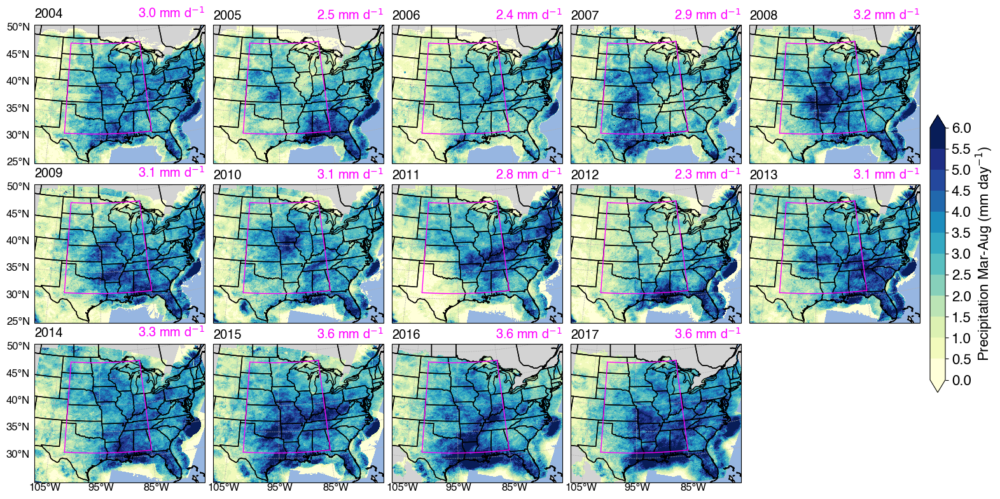

In [34]:
avg_arr = []
unit = 'mm d$^{-1}$'
for year in uniq_years:
    avg_arr.append(f'{totpcp_warm_avg.sel(year=year).values.item():.1f} {unit}')

levels = np.arange(0, 6.01, 0.5)
cbticks = np.arange(0, 6.01, 0.5)
cblabel = 'Precipitation Mar-Aug (mm day$^{-1}$)'
cmap = 'YlGnBu'
# cmap = 'viridis'
figname = f'{figdir}rain_total_map_{year_min}_{year_max}_warmseason.png'
fig = plot_map_byyear(totpcp_warm, levels, cmap, cblabel, cbticks, years, figname, avg_arr=avg_arr)

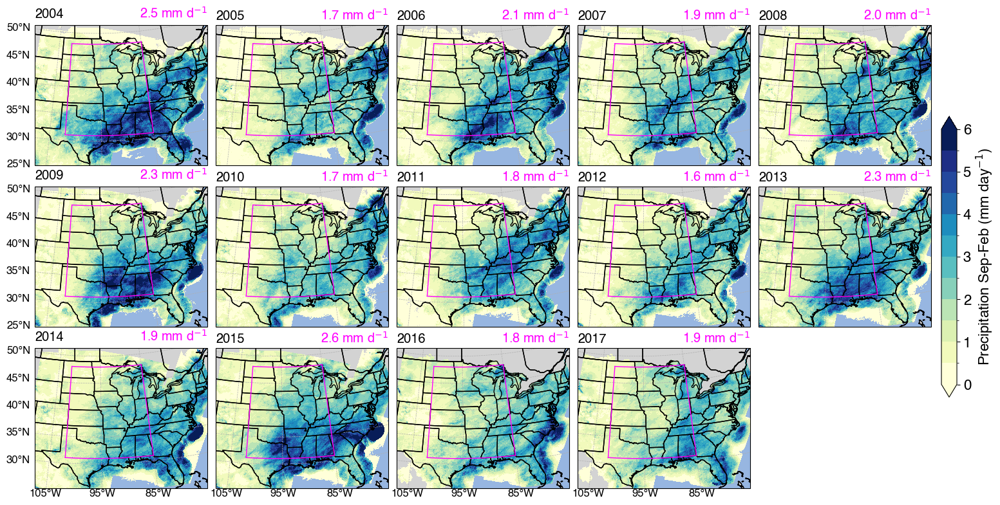

In [35]:
avg_arr = []
unit = 'mm d$^{-1}$'
for year in uniq_years:
    avg_arr.append(f'{totpcp_cold_avg.sel(year=year).values.item():.1f} {unit}')

levels = np.arange(0, 6.01, 0.5)
cbticks = np.arange(0, 6.01, 1)
cblabel = 'Precipitation Sep-Feb (mm day$^{-1}$)'
cmap = 'YlGnBu'
# cmap = 'viridis'
figname = f'{figdir}rain_total_map_{year_min}_{year_max}_coldseason.png'
fig = plot_map_byyear(totpcp_cold, levels, cmap, cblabel, cbticks, years, figname, avg_arr=avg_arr)

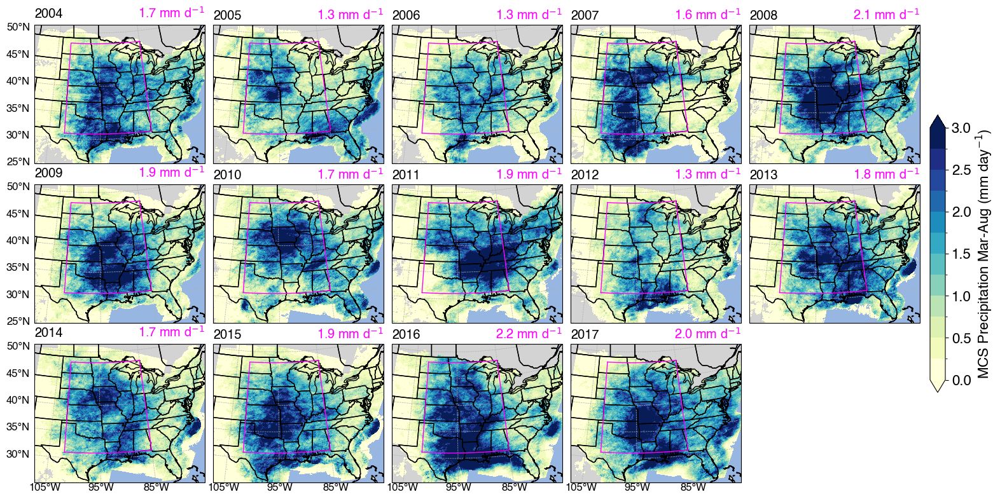

In [36]:
avg_arr = []
unit = 'mm d$^{-1}$'
for year in uniq_years:
    avg_arr.append(f'{mcspcp_warm_avg.sel(year=year).values.item():.1f} {unit}')

levels = np.arange(0, 3.01, 0.25)
cbticks = np.arange(0, 3.01, 0.5)
cblabel = 'MCS Precipitation Mar-Aug (mm day$^{-1}$)'
cmap = 'YlGnBu'
# cmap = 'viridis'
figname = f'{figdir}rain_mcs_map_{year_min}_{year_max}_warmseason.png'
fig = plot_map_byyear(mcspcp_warm, levels, cmap, cblabel, cbticks, years, figname, avg_arr=avg_arr)

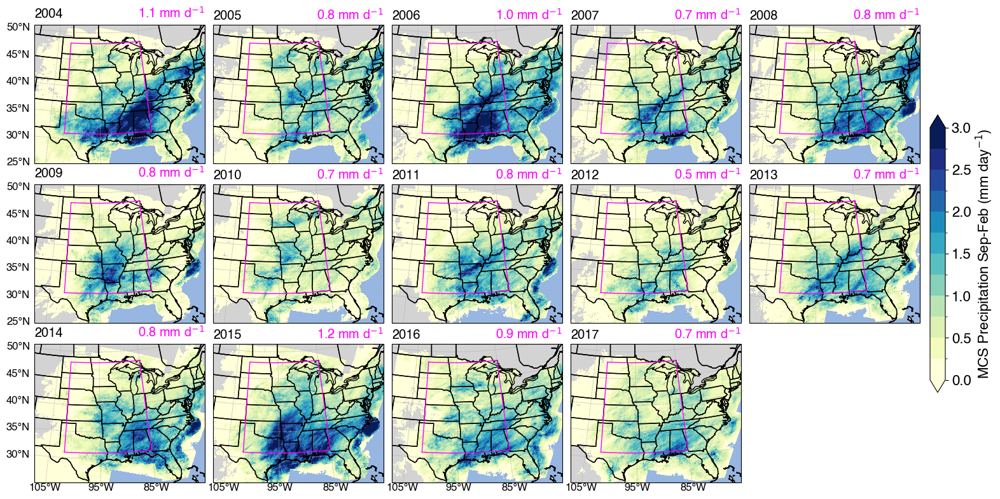

In [37]:
avg_arr = []
unit = 'mm d$^{-1}$'
for year in uniq_years:
    avg_arr.append(f'{mcspcp_cold_avg.sel(year=year).values.item():.1f} {unit}')

levels = np.arange(0, 3.01, 0.25)
cbticks = np.arange(0, 3.01, 0.5)
cblabel = 'MCS Precipitation Sep-Feb (mm day$^{-1}$)'
cmap = 'YlGnBu'
# cmap = 'viridis'
figname = f'{figdir}rain_mcs_map_{year_min}_{year_max}_coldseason.png'
fig = plot_map_byyear(mcspcp_cold, levels, cmap, cblabel, cbticks, years, figname, avg_arr=avg_arr)

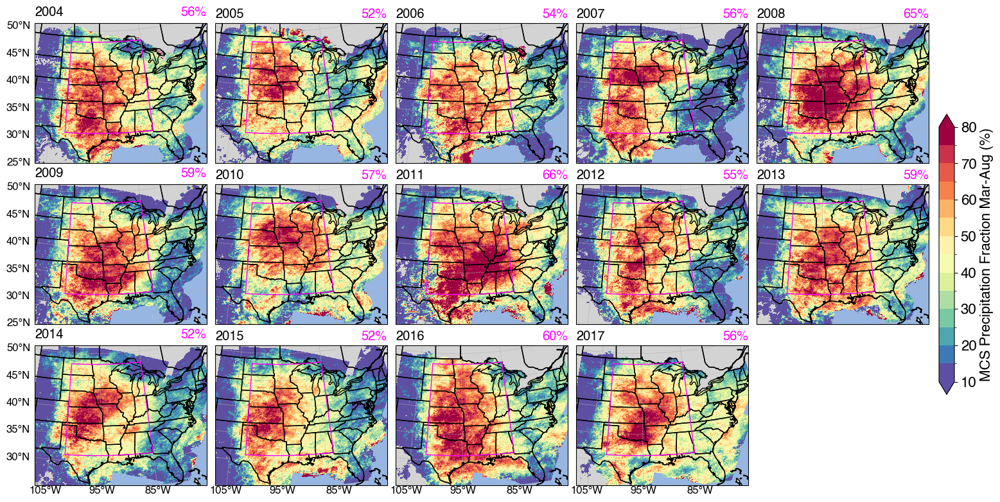

In [38]:
avg_arr = []
unit = '%'
for year in uniq_years:
    avg_arr.append(f'{mcsfrac_warm_avg.sel(year=year).values.item():.0f}{unit}')

levels = np.arange(10, 80.01, 5)
cbticks = np.arange(10, 80.01, 10)
cblabel = 'MCS Precipitation Fraction Mar-Aug (%)'
cmap = 'Spectral_r'
figname = f'{figdir}rainfrac_mcs_map_{year_min}_{year_max}_warmseason.png'
fig = plot_map_byyear(mcsfrac_warm, levels, cmap, cblabel, cbticks, years, figname, avg_arr=avg_arr)

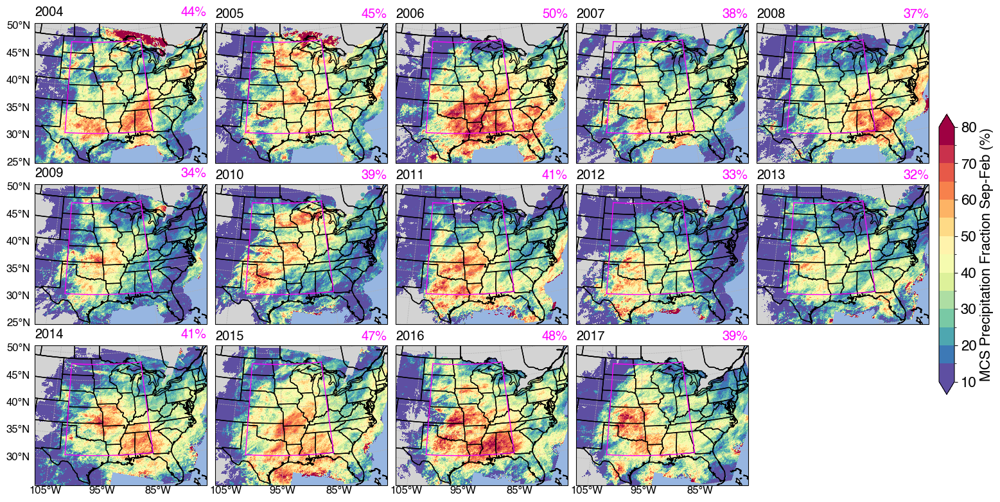

In [39]:
avg_arr = []
unit = '%'
for year in uniq_years:
    avg_arr.append(f'{mcsfrac_cold_avg.sel(year=year).values.item():.0f}{unit}')
    
levels = np.arange(10, 80.01, 5)
cbticks = np.arange(10, 80.01, 10)
cblabel = 'MCS Precipitation Fraction Sep-Feb (%)'
cmap = 'Spectral_r'
figname = f'{figdir}rainfrac_mcs_map_{year_min}_{year_max}_coldseason.png'
fig = plot_map_byyear(mcsfrac_cold, levels, cmap, cblabel, cbticks, years, figname, avg_arr=avg_arr)

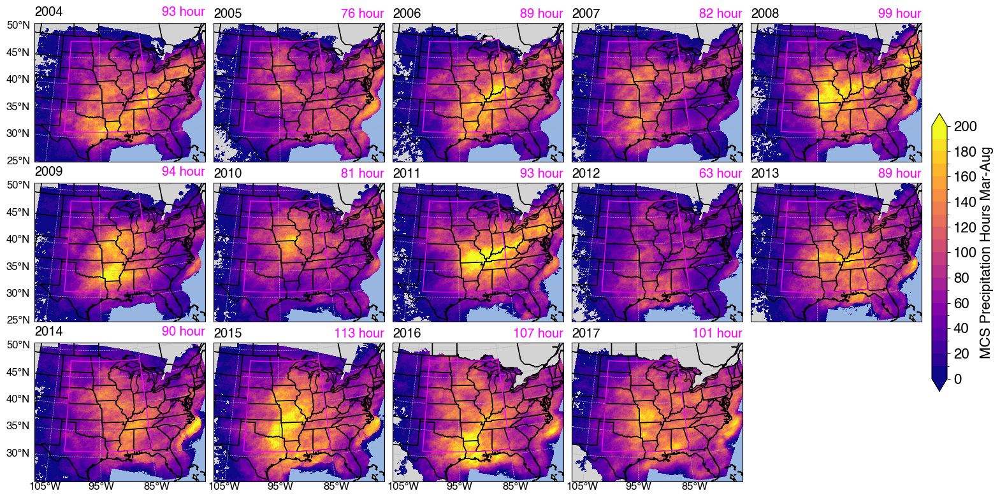

In [40]:
avg_arr = []
unit = 'hour'
for year in uniq_years:
    avg_arr.append(f'{mcspcpcount_warm_avg.sel(year=year).values.item():.0f} {unit}')

levels = np.arange(0, 200.01, 10)
cbticks = np.arange(0, 200.01, 20)
cblabel = 'MCS Precipitation Hours Mar-Aug'
cmap = 'plasma'
figname = f'{figdir}rainhour_mcs_map_{year_min}_{year_max}_warmseason.png'
fig = plot_map_byyear(mcspcpcount_warm, levels, cmap, cblabel, cbticks, years, figname, avg_arr=avg_arr)

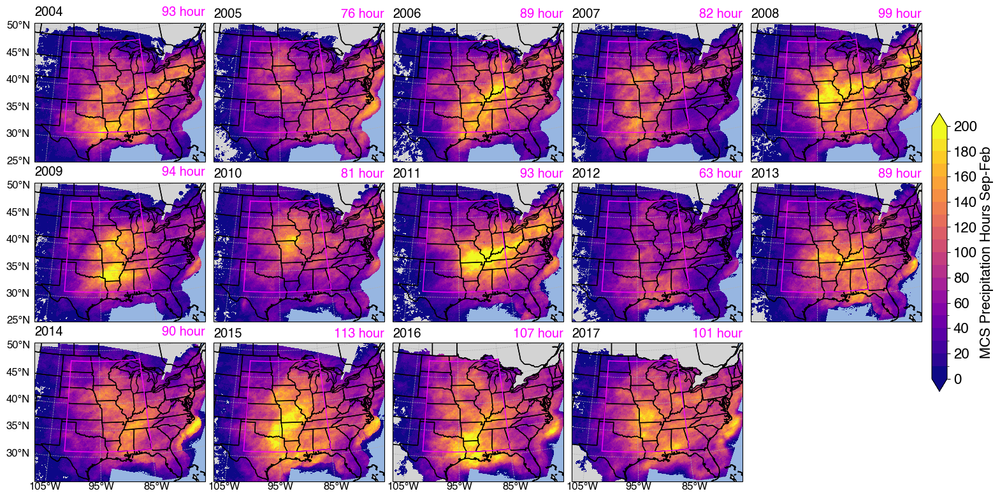

In [41]:
avg_arr = []
unit = 'hour'
for year in uniq_years:
    avg_arr.append(f'{mcspcpcount_cold_avg.sel(year=year).values.item():.0f} {unit}')

levels = np.arange(0, 200.01, 10)
cbticks = np.arange(0, 200.01, 20)
cblabel = 'MCS Precipitation Hours Sep-Feb'
cmap = 'plasma'
figname = f'{figdir}rainhour_mcs_map_{year_min}_{year_max}_coldseason.png'
fig = plot_map_byyear(mcspcpcount_cold, levels, cmap, cblabel, cbticks, years, figname, avg_arr=avg_arr)

In [1]:
# levels = np.arange(-2, 2.01, 0.25)
# cbticks = np.arange(-2, 2.01, 1)
# cblabel = 'MCS Precipitation Anomaly Mar-Aug (mm day$^{-1}$)'
# cmap = 'RdBu'
# figname = f'{figdir}rain_mcs_map_{year_min}_{year_max}_warmseason_anomaly.png'
# fig = plot_map_byyear(mcspcp_warm_anom, levels, cmap, cblabel, cbticks, years, figname)

In [2]:
# levels = np.arange(-2, 2.01, 0.25)
# cbticks = np.arange(-2, 2.01, 1)
# cblabel = 'MCS Precipitation Anomaly Sep-Feb (mm day$^{-1}$)'
# cmap = 'RdBu'
# figname = f'{figdir}rain_mcs_map_{year_min}_{year_max}_coldseason_anomaly.png'
# fig = plot_map_byyear(mcspcp_cold_anom, levels, cmap, cblabel, cbticks, years, figname)